In [0]:
import cv2
from cv2 import imread
from cv2 import imshow
from cv2 import waitKey
from cv2 import destroyAllWindows
from cv2 import CascadeClassifier
from cv2 import rectangle
from google.colab.patches import cv2_imshow
from PIL import Image

In [2]:
!pip install mtcnn

     |████████████████████████████████| 2.3MB 2.8MB/s 


In [3]:
from matplotlib import pyplot
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
import matplotlib.pyplot as plt
from mtcnn.mtcnn import MTCNN

Using TensorFlow backend.


In [0]:
from keras.models import load_model
from random import choice
from datetime import datetime
import pytz
import os
from os import listdir
from os.path import isdir
import numpy as np
from numpy import asarray
from numpy import savez_compressed
from numpy import load
from numpy import expand_dims
from numpy import savez_compressed

In [0]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC

In [0]:
import smtplib
from email.mime.multipart import MIMEMultipart
from email.mime.text import MIMEText
from email.mime.image import MIMEImage
from email.mime.base import MIMEBase
from email import encoders

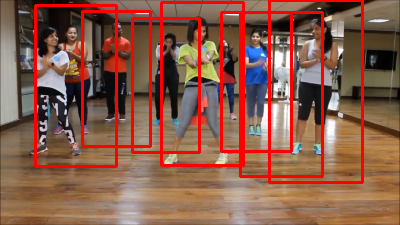

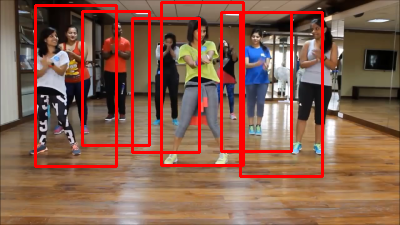

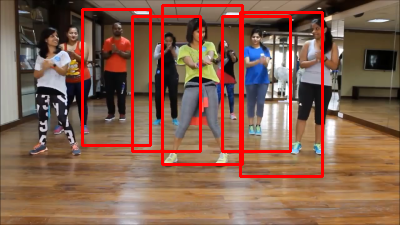

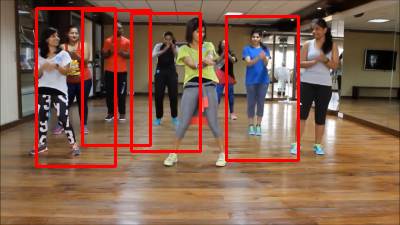

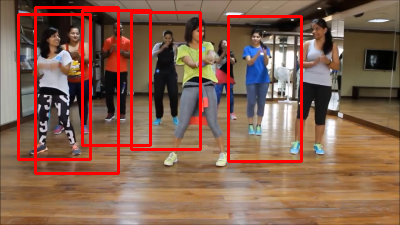

...

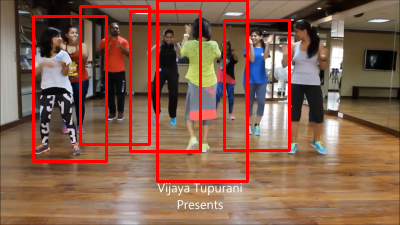

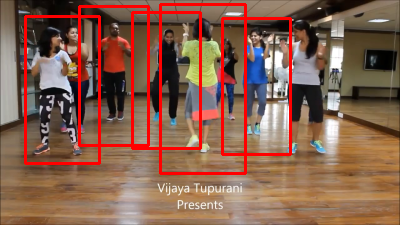

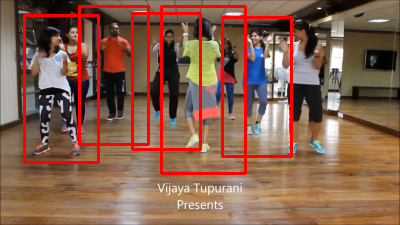

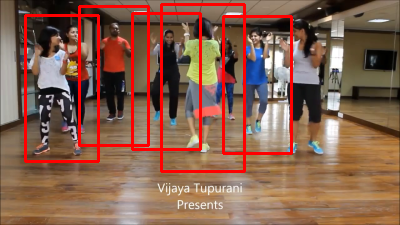

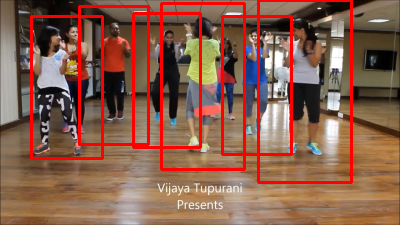

KeyboardInterrupt: ignored

In [7]:
# Detect human from the video by rectangular box
import cv2 
import imutils 
from google.colab.patches import cv2_imshow
   
# Initializing the HOG person 
# detector 
hog = cv2.HOGDescriptor() 
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector()) 
   
cap = cv2.VideoCapture('/content/drive/My Drive/ColoabDataset/Video/dancetrim.mp4')
   
while cap.isOpened(): 
    # Reading the video stream 
    ret, image = cap.read() 
    if ret: 
        image = imutils.resize(image,  
                               width=min(400, image.shape[1])) 
   
        # Detecting all the regions  
        # in the Image that has a  
        # pedestrians inside it 
        (regions, _) = hog.detectMultiScale(image, 
                                            winStride=(4, 4), 
                                            padding=(4, 4), 
                                            scale=1.05) 
   
        # Drawing the regions in the  
        # Image 
        for (x, y, w, h) in regions: 
            # cv2.rectangle(image, start_point, end_point, color, thickness) 
            cv2.rectangle(image, (x, y), 
                          (x + w, y + h),  
                          (0, 0, 255), 2) 
   
        # Showing the output Image 
        cv2_imshow( image) 
        if cv2.waitKey(25) & 0xFF == ord('q'): 
            break
    else: 
        break
  
cap.release() 
cv2.destroyAllWindows()

In [8]:
# Taking screenshot of detected person from the video
import numpy as np
import cv2
import time

#import the cascade for face detection
face_cascade = cv2.CascadeClassifier('/content/drive/My Drive/ColoabDataset/haarcascade_frontalface_default.xml')

def TakeSnapshotAndSave():
    # access the webcam (every webcam has a number, the default is 0)
    cap = cv2.VideoCapture('/content/drive/My Drive/ColoabDataset/Video/dancetrim.mp4')
    fps = cap.get(cv2.CAP_PROP_FPS)  # OpenCV2 version 2 used "CV_CAP_PROP_FPS"
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = frame_count / fps

    minutes = int(duration / 60)
    seconds = round(duration % 60)
    length = f'{minutes}:{seconds}'
    num = 0 
    while num<=200:
        # Capture frame-by-frame
        ret, frame = cap.read()

        # to detect faces in video
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x,y,w,h) in faces:
            # cv2.rectangle(frame,(x,y),(x+w,y+h),(255,0,0),2)
            # roi_gray = gray[y:y+h, x:x+w]
            # roi_color = frame[y:y+h, x:x+w]

            # x = 0
            # y = 20
            # text_color = (0,255,0)
            if (num%10==0):
              cv2.imwrite('opencv'+str(int(num/10))+'.jpg',frame)
            num = num+1

    # When everything done, release the capture
    cap.release()
    cv2.destroyAllWindows()


if __name__ == "__main__":
    TakeSnapshotAndSave()

KeyboardInterrupt: ignored

In [9]:
# Reducing resolution of the image
image_file = imread('/content/drive/My Drive/ColoabDataset/image/friend.jpg')
# pixels = cv2.resize(image_file, (768,576), interpolation = cv2.INTER_AREA)
pixels = cv2.resize(image_file, (1536,1152), interpolation = cv2.INTER_AREA)
cv2.imwrite('frndgangtemp.jpg', pixels)

True

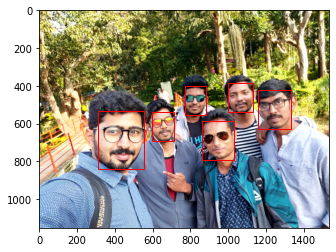

In [10]:
# draw an image with detected objects
def draw_image_with_boxes(filename, result_list):
	# load the image
	data = pyplot.imread(filename)
	# plot the image
	pyplot.imshow(data)
	# get the context for drawing boxes
	ax = pyplot.gca()
	# plot each box
	for result in result_list:
		# get coordinates
		x, y, width, height = result['box']
		# create the shape
		rect = Rectangle((x, y), width, height, fill=False, color='red')
		# draw the box
		ax.add_patch(rect)
	# show the plot
	pyplot.show()

filename = '/content/drive/My Drive/ColoabDataset/image/frndgang.jpg'
# load image from file
pixels = pyplot.imread(filename)
# create the detector, using default weights
detector = MTCNN()
# detect faces in the image
faces = detector.detect_faces(pixels)
# display faces on the original image
draw_image_with_boxes(filename, faces)

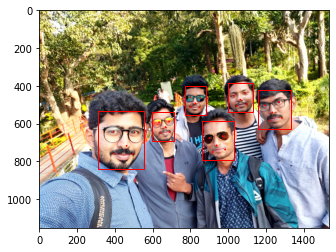

In [11]:
# face detection with mtcnn on a photograph
# draw an image with detected objects
def draw_image_with_boxes(filename, result_list):
	# load the image
	data = pyplot.imread(filename)
	# plot the image
	pyplot.imshow(data)
	# get the context for drawing boxes
	ax = pyplot.gca()
	# plot each box
	for result in result_list:
		# get coordinates
		x, y, width, height = result['box']
		# create the shape
		rect = Rectangle((x, y), width, height, fill=False, color='red')
		# draw the box
		ax.add_patch(rect)
		# draw the dots
		for key, value in result['keypoints'].items():
			# create and draw dot
			dot = Circle(value, radius=2, color='red')
			ax.add_patch(dot)
	# show the plot
	pyplot.show()
filename = '/content/drive/My Drive/ColoabDataset/image/frndgang.jpg'
# load image from file
pixels = pyplot.imread(filename)
# create the detector, using default weights
detector = MTCNN()
# detect faces in the image
faces = detector.detect_faces(pixels)
# display faces on the original image
draw_image_with_boxes(filename, faces)

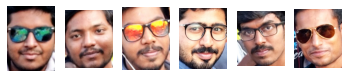

In [12]:
# extract and plot each detected face in a photograph
# draw each face separately
def draw_faces(filename, result_list):
	# load the image
	data = pyplot.imread(filename)
	# plot each face as a subplot
	for i in range(len(result_list)):
		# get coordinates
		x1, y1, width, height = result_list[i]['box']
		x2, y2 = x1 + width, y1 + height
		# define subplot
		pyplot.subplot(1, len(result_list), i+1)
		pyplot.axis('off')
		# plot face
		# cv2.imwrite('/content/drive/My Drive/ColoabDataset/StrangerDetection/data/val/%s.jpg'%(i), data[y1:y2, x1:x2])
		# pyplot.imsave('/content/drive/My Drive/ColoabDataset/StrangerDetection/data/val/%s.jpg'%(i), data[y1:y2, x1:x2])
		pyplot.imshow(data[y1:y2, x1:x2])
	# show the plot
	pyplot.show()
# filename = '/content/drive/My Drive/ColoabDataset/image/uday.jpg'
filename = '/content/drive/My Drive/ColoabDataset/image/frndgang.jpg'
# load image from file
pixels = pyplot.imread(filename)
# create the detector, using default weights
detector = MTCNN()
# detect faces in the image
faces = detector.detect_faces(pixels)
# display faces on the original image
draw_faces(filename, faces)

In [0]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(160, 160)):
	# load image from file
	image = Image.open(filename)
	# convert to RGB, if needed
	image = image.convert('RGB')
	check = filename.split('/')[-3]
	a = 0
	if a==0:
		# convert to array
		pixels = asarray(image)
		# print(pixels)
		# create the detector, using default weights
		detector = MTCNN()
		# detect faces in the image
		results = detector.detect_faces(pixels)
		# print(results)
		# extract the bounding box from the first face
		try:
			x1, y1, width, height = results[0]['box']
			# bug fix
			x1, y1 = abs(x1), abs(y1)
			x2, y2 = x1 + width, y1 + height
			# extract the face
			face = pixels[y1:y2, x1:x2]
			# resize pixels to the model size
			image = Image.fromarray(face)
		except Exception as error:
			print("Error-", error)
	image = image.resize(required_size)
	face_array = asarray(image)
	return face_array

In [0]:
# load images and extract faces for all images in a directory
def load_faces(directory):
	faces = list()
	# enumerate files
	for filename in listdir(directory):
		# path
		path = directory + filename
		# get face
		face = extract_face(path)
		# store
		faces.append(face)
	return faces

In [0]:
# load a dataset that contains one subdir for each class that in turn contains images
def load_dataset(directory):
	X, y = list(), list()
	# enumerate folders, on per class
	for subdir in listdir(directory):
		# path
		path = directory + subdir + '/'
		# skip any files that might be in the dir
		if not isdir(path):
			continue
		# load all faces in the subdirectory
		try:
			faces = load_faces(path)
		except Exception as E:
			print('Issue- ', path)
		# create labels
		labels = [subdir for _ in range(len(faces))]
		# summarize progress
		print('>loaded %d examples for class: %s' % (len(faces), subdir))
		# store
		X.extend(faces)
		y.extend(labels)
	return asarray(X), asarray(y)

In [16]:
# load train dataset
trainX, trainy = load_dataset('/content/drive/My Drive/ColoabDataset/StrangerDetection/data/train/')
print(trainX.shape, trainy.shape)
# load test dataset
testX, testy = load_dataset('/content/drive/My Drive/ColoabDataset/StrangerDetection/data/val/')
print(testX.shape, testy.shape)
# save arrays to one file in compressed format
savez_compressed('stranger-faces-dataset.npz', trainX, trainy, testX, testy)

>loaded 14 examples for class: madhan
>loaded 8 examples for class: kishore
(22, 160, 160, 3) (22,)
>loaded 6 examples for class: madhan
>loaded 1 examples for class: kishore
(7, 160, 160, 3) (7,)


In [18]:
# calculate a face embedding for each face in the dataset using facenet

# get the face embedding for one face
def get_embedding(model, face_pixels):
	# scale pixel values
	face_pixels = face_pixels.astype('float32')
	# standardize pixel values across channels (global)
	mean, std = face_pixels.mean(), face_pixels.std()
	face_pixels = (face_pixels - mean) / std
	# transform face into one sample
	samples = expand_dims(face_pixels, axis=0)
	# make prediction to get embedding
	yhat = model.predict(samples)
	return yhat[0]
# load the face dataset
data = load('stranger-faces-dataset.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print('Loaded: ', trainX.shape, trainy.shape, testX.shape, testy.shape)
# load the facenet model
model = load_model('/content/drive/My Drive/ColoabDataset/Facenet/facenet_keras.h5')
print('Loaded Model')
# convert each face in the train set to an embedding
newTrainX = list()
for face_pixels in trainX:
	embedding = get_embedding(model, face_pixels)
	newTrainX.append(embedding)
newTrainX = asarray(newTrainX)
print(newTrainX.shape)
# convert each face in the test set to an embedding
newTestX = list()
for face_pixels in testX:
	embedding = get_embedding(model, face_pixels)
	newTestX.append(embedding)
newTestX = asarray(newTestX)
print(newTestX.shape)
# save arrays to one file in compressed format
savez_compressed('stranger-faces-embeddings.npz', newTrainX, trainy, newTestX, testy)

Loaded:  (22, 160, 160, 3) (22,) (7, 160, 160, 3) (7,)


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Loaded Model
(22, 128)
(7, 128)


In [19]:
# develop a classifier for the 5 Celebrity Faces Dataset

# load dataset
data = load('stranger-faces-embeddings.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print('Dataset: train=%d, test=%d' % (trainX.shape[0], testX.shape[0]))
# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)
testX = in_encoder.transform(testX)
# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
testy = out_encoder.transform(testy)
# fit model
model = SVC(kernel='linear', probability=True)
model.fit(trainX, trainy)
# predict
yhat_train = model.predict(trainX)
yhat_test = model.predict(testX)
# score
score_train = accuracy_score(trainy, yhat_train)
score_test = accuracy_score(testy, yhat_test)
# summarize
print('Accuracy: train=%.3f, test=%.3f' % (score_train*100, score_test*100))

Dataset: train=22, test=7
Accuracy: train=100.000, test=57.143


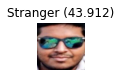

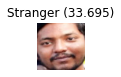

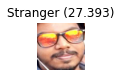

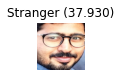

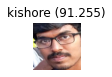

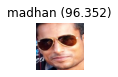

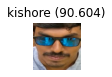

In [20]:
# load faces
data = load('stranger-faces-dataset.npz')
testX_faces = data['arr_2']
# load face embeddings
data = load('stranger-faces-embeddings.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)
testX = in_encoder.transform(testX)
# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
testy = out_encoder.transform(testy)
# fit model
model = SVC(kernel='linear', probability=True)
model.fit(trainX, trainy)
# test model on a random example from the test dataset
# selection = choice([i for i in range(testX.shape[0])])
for selection in range(testX.shape[0]):
  random_face_pixels = testX_faces[selection]
  random_face_emb = testX[selection]
  random_face_class = testy[selection]
  random_face_name = out_encoder.inverse_transform([random_face_class])
  # prediction for the face
  samples = expand_dims(random_face_emb, axis=0)
  yhat_class = model.predict(samples)
  yhat_prob = model.predict_proba(samples)
  # get name
  class_index = yhat_class[0]
  class_probability = yhat_prob[0,class_index] * 100
  predict_names = out_encoder.inverse_transform(yhat_class)
  if class_probability > 90:
    title = '%s (%.3f)' % (predict_names[0], class_probability)
  else:
    title = 'Stranger (%.3f)' % (100-class_probability)
    pyplot.imsave('/content/drive/My Drive/ColoabDataset/StrangerDetection/mail/stranger%s.jpg'%(selection), random_face_pixels)
  plt.figure(figsize=(10, 10))
  plt.subplot(1,10, selection+1)
  plt.title(title)
  plt.axis('off')
  plt.imshow(random_face_pixels)   
plt.show()

In [21]:
IST_time = pytz.timezone('Asia/Kolkata')
date_time = datetime.now(IST_time)
today_date = (str(date_time).split('.')[0]).split(' ')[0]
time_now = (str(date_time).split('.')[0]).split(' ')[1]
print(date_time)
#Set up crap for the attachments
files = "/content/drive/My Drive/ColoabDataset/StrangerDetection/mail"
filenames = [os.path.join(files, f) for f in os.listdir(files)]
number_of_person = len(filenames)
#Set up users for email
gmail_user = "SenderMailId"
gmail_pwd = "SenderMailIdPassword"
recipients = ["ReceiverMailID"]
# Create the body of the message (a plain-text and an HTML version).
html = """\
<html>
  <head></head>
  <body>
  <p style="font-size:25px;color:#0e7793;font-family:verdana">CCTV camera detects unusual movement of {person} persons in your house on {date} at {time}</p>
  <p style="font-size:25px;color: #990f06;font-family:courier"><b>For safety precaution, check the live footage of CCTV camera and alert the neighbour or police</b></p>
  </body>
</html>
""".format(person=number_of_person, date = today_date, time = time_now)
# Record the MIME types of both parts - text/plain and text/html.
part1 = MIMEText(html, 'html')
#Create Module
def mail(to, subject, attach):
   msg = MIMEMultipart()
   msg['From'] = gmail_user
   msg['To'] = ", ".join(recipients)
   msg['Subject'] = subject
   msg.attach(part1)
   #get all the attachments
   for file in filenames:
      part = MIMEBase('application', 'octet-stream')
      part.set_payload(open(file, 'rb').read())
      encoders.encode_base64(part)
      part.add_header('Content-Disposition', 'attachment; filename="%s"' % file)
      msg.attach(part)
   mailServer = smtplib.SMTP("smtp.gmail.com", 587)
   mailServer.ehlo()
   mailServer.starttls()
   mailServer.ehlo()
   mailServer.login(gmail_user, gmail_pwd)
   mailServer.sendmail(gmail_user, to, msg.as_string())
   # Should be mailServer.quit(), but that crashes...
   mailServer.close()
#send it
mail(recipients,"Alert! someone enter into your house", filenames)

2020-05-01 18:46:12.598826+05:30
